In [1]:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['font.sans-serif'] = ['Times New Roman']
plt.rcParams['figure.dpi'] = 500
plt.rcParams['text.color'] = 'w'
plt.rcParams['axes.labelcolor'] = 'k'
plt.rcParams['xtick.color'] = 'w'
plt.rcParams['ytick.color'] = 'w'
plt.rcParams['axes.edgecolor'] = 'w'
plt.rcParams['figure.facecolor'] = 'k'
plt.rcParams['axes.facecolor'] = 'k'
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.colors import LogNorm
from matplotlib.patches import FancyArrowPatch
import matplotlib.colors as colors
from astropy.visualization import SqrtStretch, LinearStretch, LogStretch
from astropy.visualization.mpl_normalize import ImageNormalize
import pandas as pd
import re
from astropy.io import fits
import os
from scipy.ndimage import map_coordinates
from scipy.stats import binned_statistic
from scipy.spatial.distance import cdist
from scipy.optimize import linear_sum_assignment
from pathlib import Path
from scipy.stats import gaussian_kde
import seaborn as sns

from matplotlib.lines import Line2D
os.chdir("/Users/ainsleylewis/Documents/Astronomy/IllustrisTNG Lens Modelling")

In [2]:
df = pd.read_csv('/Volumes/T7 Shield/Simulation Output/System 1/Sim 5.csv', header=0)

In [3]:
df

,m,n,o,num_images,pos_rms,mag_rms,avg_mag_per,chi2,source_x,source_y,...,SIE_y,SIE_e,SIE_$θ_{e}$,SIE_$r_{core}$,"PERT_$z_{s,fid}$",PERT_x,PERT_y,PERT_$\gamma$,PERT_$θ_{\gamma}$,PERT_$\kappa$
0,0.001,0.00000,-0.5,4,0.008523,58.084136,846.418153,167.885000,20.80188,20.77843,...,20.76843,0.000010,-6.795724,0.0,1.0,20.78,20.78,0.014439,-4.550516,0.292723
1,0.001,3.63636,-0.5,4,0.000034,24.844897,422.699298,0.000002,20.80701,20.78065,...,20.76408,0.105795,24.203200,0.0,1.0,20.78,20.78,0.026743,-37.793790,0.219530
2,0.001,7.27273,-0.5,4,0.000034,27.397800,452.522086,0.000003,20.81258,20.78086,...,20.76975,0.093800,44.282660,0.0,1.0,20.78,20.78,0.039339,-30.213120,0.050544
3,0.001,10.90909,-0.5,4,0.000034,10.185205,235.755008,0.000004,20.82623,20.78124,...,20.77021,0.095062,45.967720,0.0,1.0,20.78,20.78,0.056818,-29.737750,-0.347719
4,0.001,14.54545,-0.5,4,0.000034,42.393086,642.549685,0.000004,20.80325,20.78058,...,20.76589,0.096942,29.879490,0.0,1.0,20.78,20.78,0.024390,-35.030900,0.325939
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
999995,0.100,345.45455,0.5,4,0.000034,56.205487,814.768662,0.000004,20.80174,20.78055,...,20.76727,0.093091,34.859320,0.0,1.0,20.78,20.78,0.023937,326.862100,0.368361
999996,0.100,349.09091,0.5,4,0.000034,22.347478,391.012158,0.000002,20.80845,20.78069,...,20.76450,0.103411,25.429000,0.0,1.0,20.78,20.78,0.028539,322.876800,0.177103
999997,0.100,352.72727,0.5,4,0.000034,3.954568,153.255887,0.000003,20.83919,20.78160,...,20.77079,0.097111,48.007720,0.0,1.0,20.78,20.78,0.074396,330.831000,-0.726236
999998,0.100,356.36364,0.5,4,0.000034,177.536954,2351.129297,0.000002,20.79062,20.78025,...,20.76144,0.124205,17.834310,0.0,1.0,20.78,20.78,0.009828,317.614400,0.694569


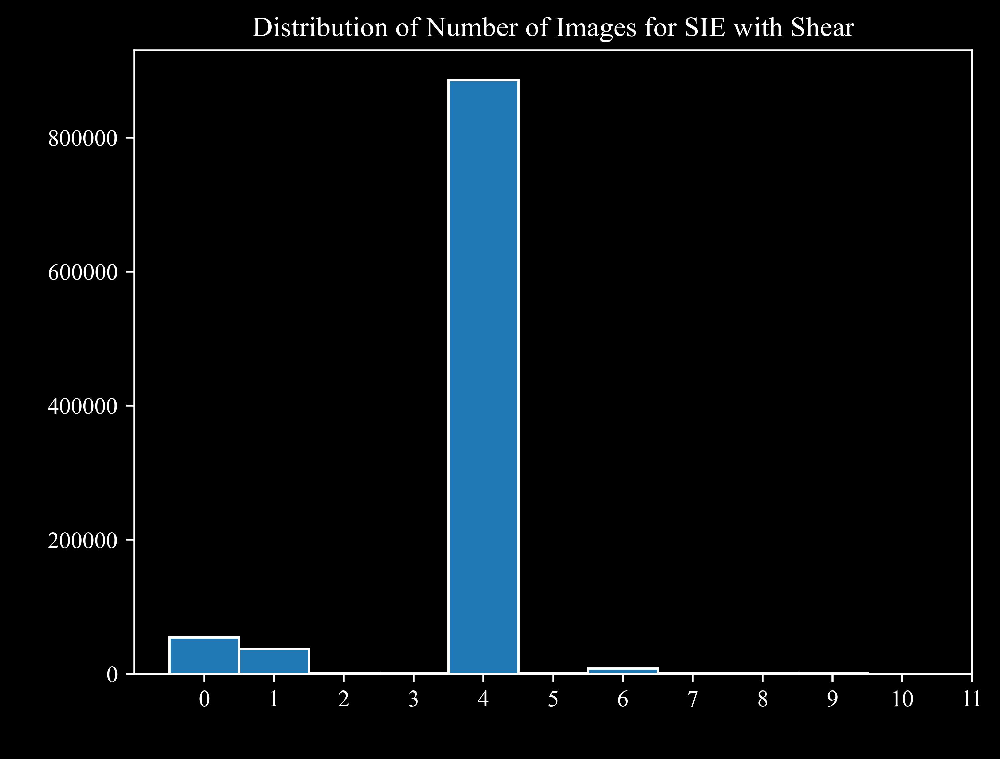

In [4]:
plt.hist(df['num_images'], bins=range(0, 11), align='left', edgecolor='w')
plt.xlabel('Number of Images')
plt.ylabel('Frequency')
plt.title('Distribution of Number of Images for SIE with Shear')
plt.xticks([0,1,2,3,4,5,6,7,8,9,10,11])
plt.show()

In [5]:
mask = df['num_images'] == 4
filtered_df_0 = df[mask]
filtered_df_0 = filtered_df_0.reset_index(drop=True)

# Precentage of 4 image models 
percentage_4_images = (len(filtered_df_0) / len(df)) * 100
print(f"Percentage of 4 image models: {percentage_4_images:.2f}%")

Percentage of 4 image models: 88.64%


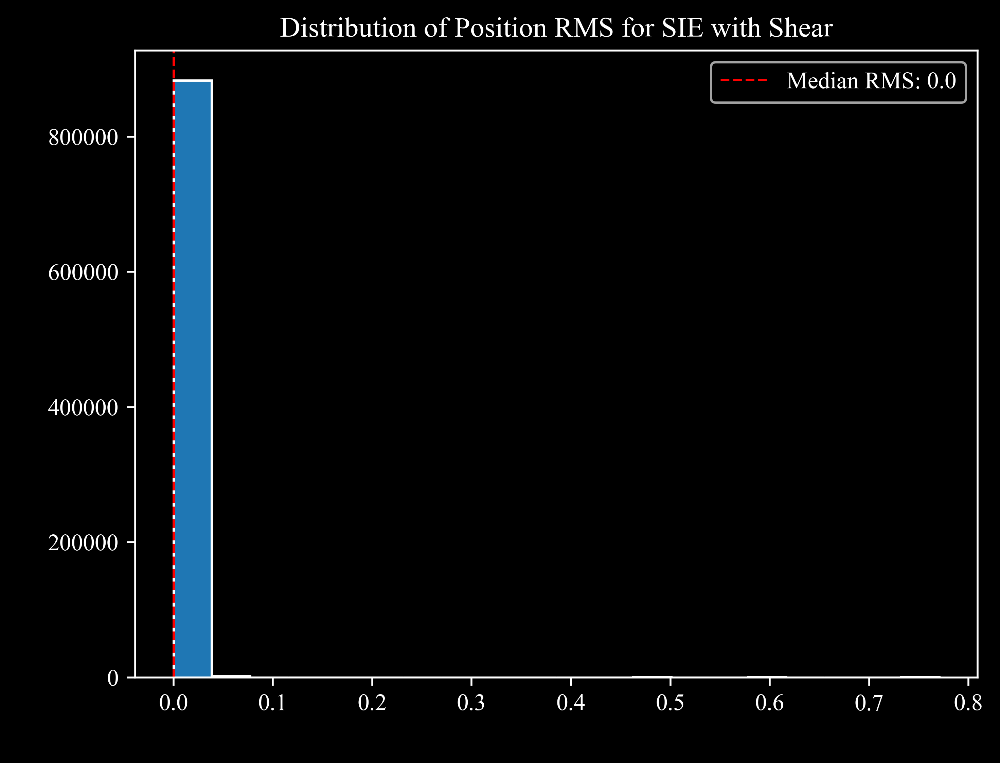

In [6]:
plt.hist(filtered_df_0['pos_rms'], bins=20, edgecolor='w')
plt.axvline(filtered_df_0['pos_rms'].median(), color='r', linestyle='dashed', linewidth=1, label='Median RMS: ' + str(round(filtered_df_0['pos_rms'].median(), 4)))
plt.xlabel('Position RMS')
plt.ylabel('Frequency')
plt.legend()
plt.title('Distribution of Position RMS for SIE with Shear')
plt.show()

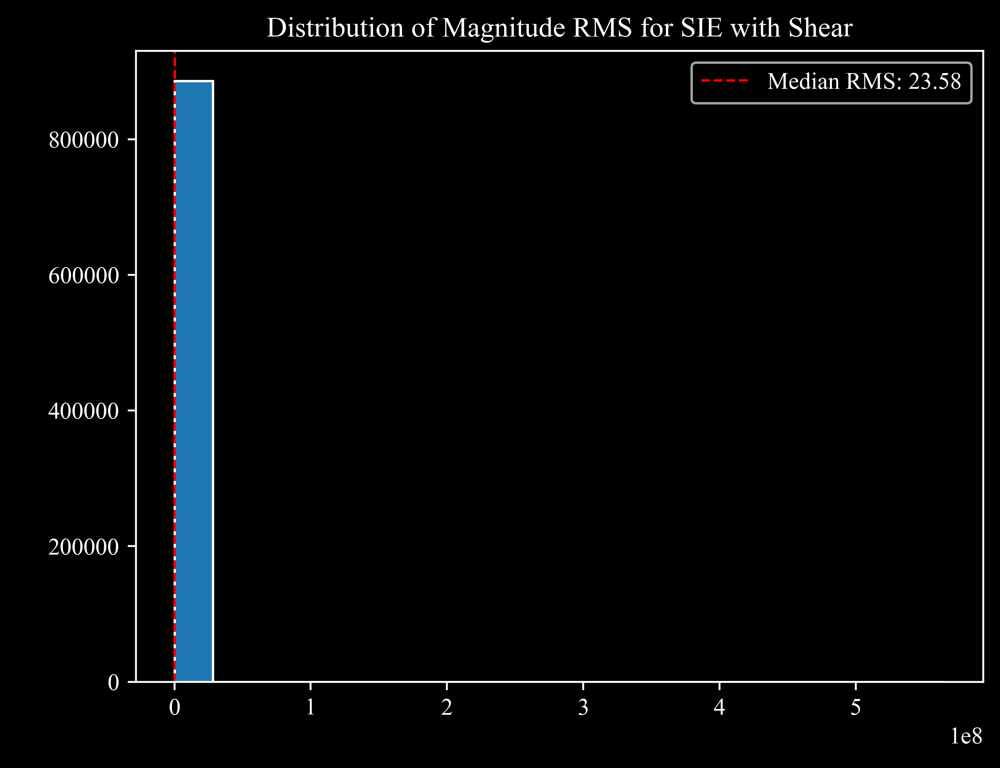

In [7]:
plt.hist(filtered_df_0['mag_rms'], bins=20, edgecolor='w')
plt.axvline(filtered_df_0['mag_rms'].median(), color='r', linestyle='dashed', linewidth=1, label='Median RMS: ' + str(round(filtered_df_0['mag_rms'].median(), 2)))
plt.xlabel('Magnitude RMS')
plt.ylabel('Frequency')
plt.legend()
plt.title('Distribution of Magnitude RMS for SIE with Shear')
plt.show()

In [10]:
mask2 = filtered_df_0['pos_rms']  == 3.354101966255108e-05
filtered_df = filtered_df_0[mask2]
filtered_df = filtered_df.reset_index(drop=True)
filtered_df

,m,n,o,num_images,pos_rms,mag_rms,avg_mag_per,chi2,source_x,source_y,...,SIE_y,SIE_e,SIE_$θ_{e}$,SIE_$r_{core}$,"PERT_$z_{s,fid}$",PERT_x,PERT_y,PERT_$\gamma$,PERT_$θ_{\gamma}$,PERT_$\kappa$
0,0.001,3.63636,-0.5,4,0.000034,24.844897,422.699298,0.000002,20.80701,20.78065,...,20.76408,0.105795,24.203200,0.0,1.0,20.78,20.78,0.026743,-37.79379,0.219530
1,0.001,7.27273,-0.5,4,0.000034,27.397800,452.522086,0.000003,20.81258,20.78086,...,20.76975,0.093800,44.282660,0.0,1.0,20.78,20.78,0.039339,-30.21312,0.050544
2,0.001,10.90909,-0.5,4,0.000034,10.185205,235.755008,0.000004,20.82623,20.78124,...,20.77021,0.095062,45.967720,0.0,1.0,20.78,20.78,0.056818,-29.73775,-0.347719
3,0.001,14.54545,-0.5,4,0.000034,42.393086,642.549685,0.000004,20.80325,20.78058,...,20.76589,0.096942,29.879490,0.0,1.0,20.78,20.78,0.024390,-35.03090,0.325939
4,0.001,18.18182,-0.5,4,0.000034,34.145392,538.223087,0.000003,20.80669,20.78068,...,20.76722,0.093172,34.664950,0.0,1.0,20.78,20.78,0.029334,-33.20445,0.224476
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
644203,0.100,345.45455,0.5,4,0.000034,56.205487,814.768662,0.000004,20.80174,20.78055,...,20.76727,0.093091,34.859320,0.0,1.0,20.78,20.78,0.023937,326.86210,0.368361
644204,0.100,349.09091,0.5,4,0.000034,22.347478,391.012158,0.000002,20.80845,20.78069,...,20.76450,0.103411,25.429000,0.0,1.0,20.78,20.78,0.028539,322.87680,0.177103
644205,0.100,352.72727,0.5,4,0.000034,3.954568,153.255887,0.000003,20.83919,20.78160,...,20.77079,0.097111,48.007720,0.0,1.0,20.78,20.78,0.074396,330.83100,-0.726236
644206,0.100,356.36364,0.5,4,0.000034,177.536954,2351.129297,0.000002,20.79062,20.78025,...,20.76144,0.124205,17.834310,0.0,1.0,20.78,20.78,0.009828,317.61440,0.694569


In [11]:
# Percentage Calc
num_goodfit = len(filtered_df)
num_total = len(df[df['num_images'] == 4])
percentage_goodfit = (num_goodfit / num_total) * 100
print(f"Percentage of good fits out of 4 image models: {percentage_goodfit:.2f}%")

num_goodfit = len(filtered_df)
num_total = len(df)
percentage_goodfit = (num_goodfit / num_total) * 100
print(f"Percentage of good fits: {percentage_goodfit:.2f}%")

Percentage of good fits out of 4 image models: 72.68%
Percentage of good fits: 64.42%


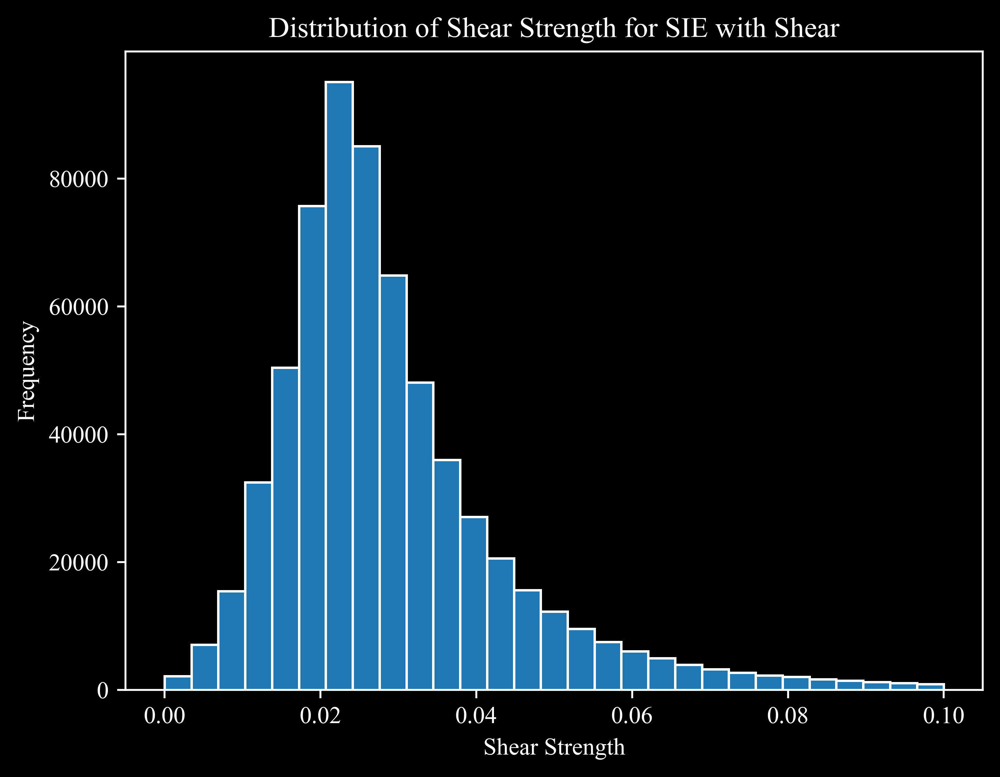

In [17]:
bins = np.linspace(0, 0.1, 30)
plt.hist(filtered_df['PERT_$\\gamma$'], bins=bins, edgecolor='w')
plt.xlabel('Shear Strength', color = 'w')
plt.ylabel('Frequency', color = 'w')
plt.title('Distribution of Shear Strength for SIE with Shear')
plt.show()

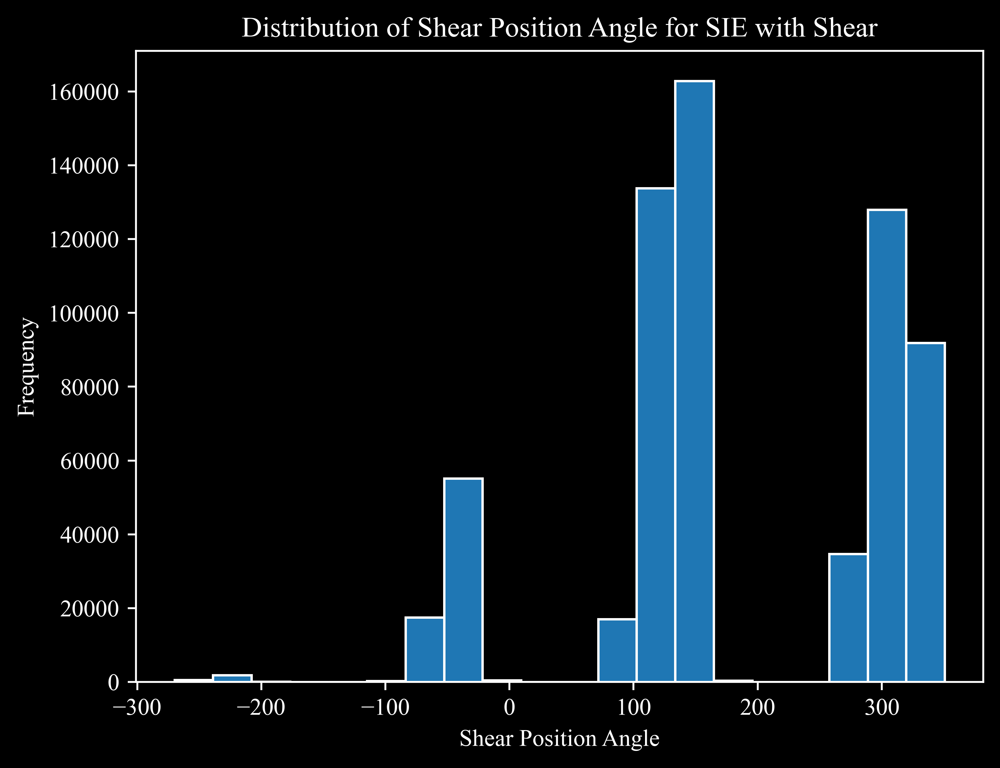

In [19]:
plt.hist(filtered_df['PERT_$θ_{\\gamma}$'], bins=20, edgecolor='w')
plt.xlabel('Shear Position Angle', color = 'w')
plt.ylabel('Frequency', color = 'w')
plt.title('Distribution of Shear Position Angle for SIE with Shear')
plt.show()

In [21]:
aligned_pa = (filtered_df['PERT_$θ_{\\gamma}$'] > 100) & (filtered_df['PERT_$θ_{\\gamma}$'] < 200)
num_aligned = len(filtered_df[aligned_pa])
print(f"Number of aligned shear position angles: {num_aligned}")
anti_aligned_pa = (filtered_df['PERT_$θ_{\\gamma}$'] < 0) | (filtered_df['PERT_$θ_{\\gamma}$'] > 200)
print(f"Number of anti-aligned shear position angles: {len(filtered_df[anti_aligned_pa])}")

# Percentage
percentage_aligned = (num_aligned / len(filtered_df)) * 100
print(f"Percentage of aligned shear position angles: {percentage_aligned:.2f}%")
percentage_anti_aligned = (len(filtered_df[anti_aligned_pa]) / len(filtered_df)) * 100
print(f"Percentage of anti-aligned shear position angles: {percentage_anti_aligned:.2f}%")

Number of aligned shear position angles: 303030
Number of anti-aligned shear position angles: 330157
Percentage of aligned shear position angles: 47.04%
Percentage of anti-aligned shear position angles: 51.25%


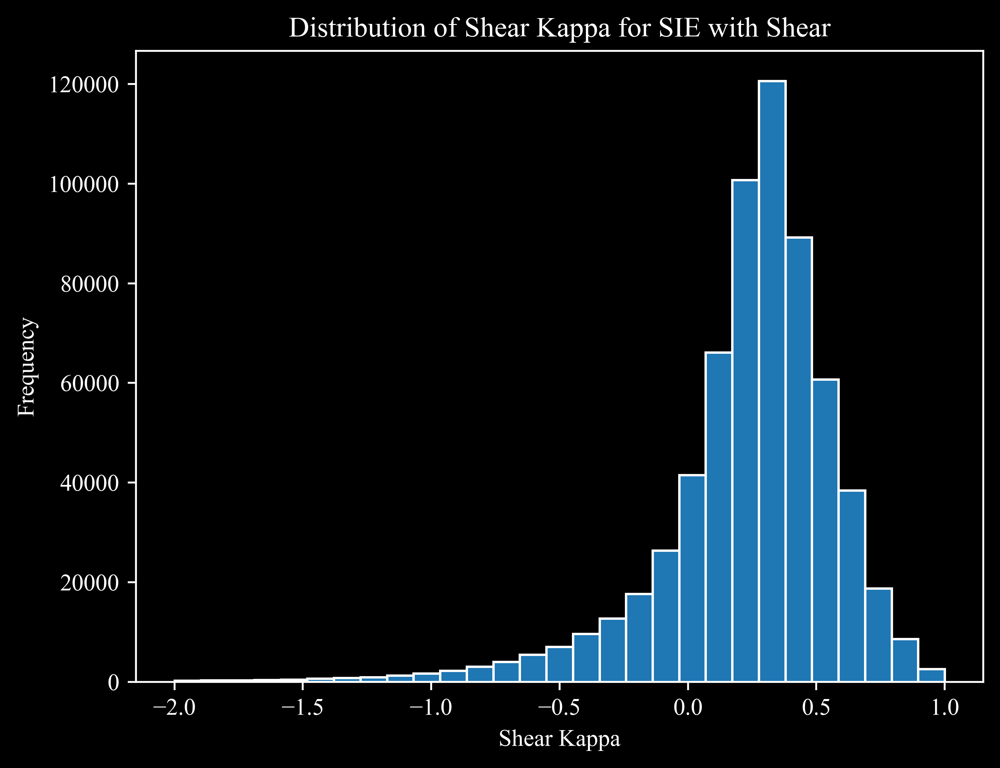

In [23]:
bins = np.linspace(-2, 1, 30)
plt.hist(filtered_df['PERT_$\kappa$'], bins=bins, edgecolor='w')
plt.xlabel('Shear Kappa', color = 'w')
plt.ylabel('Frequency', color = 'w')
plt.title('Distribution of Shear Kappa for SIE with Shear')
plt.show()

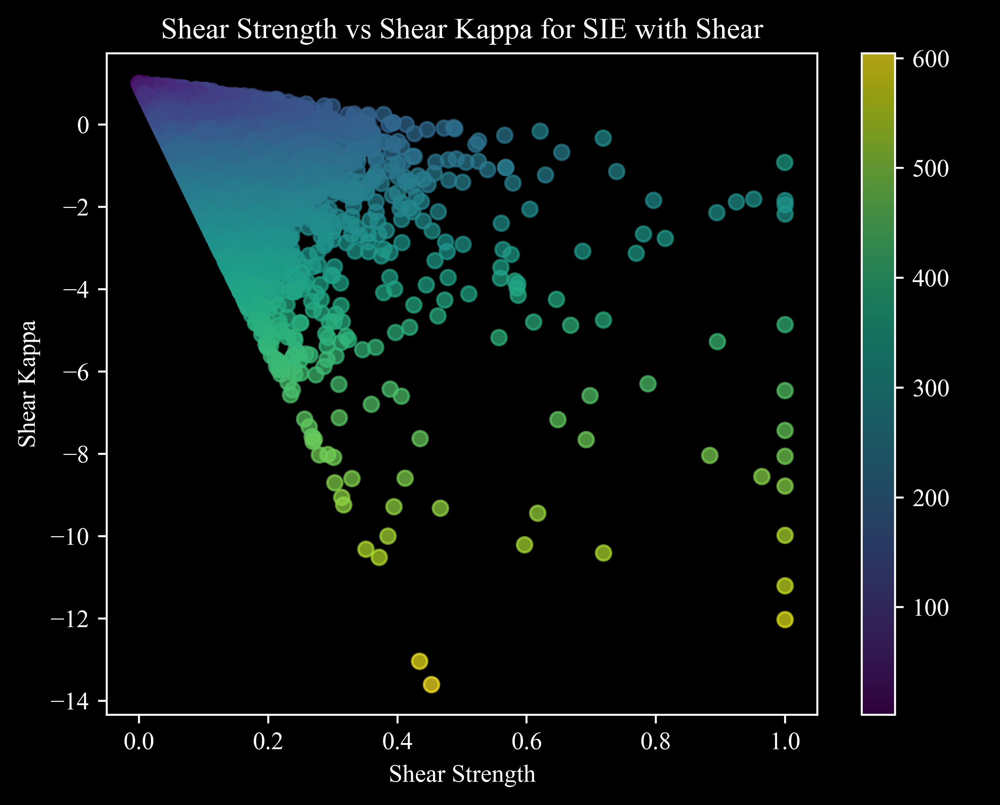

In [26]:
plt.scatter(filtered_df['PERT_$\\gamma$'], filtered_df['PERT_$\\kappa$'], c=filtered_df['SIE_$\\sigma$'], alpha=0.7)
plt.colorbar(label='SIE Vel Disp')
plt.xlabel('Shear Strength', color = 'w')
plt.ylabel('Shear Kappa', color = 'w')
plt.title('Shear Strength vs Shear Kappa for SIE with Shear')
plt.show()

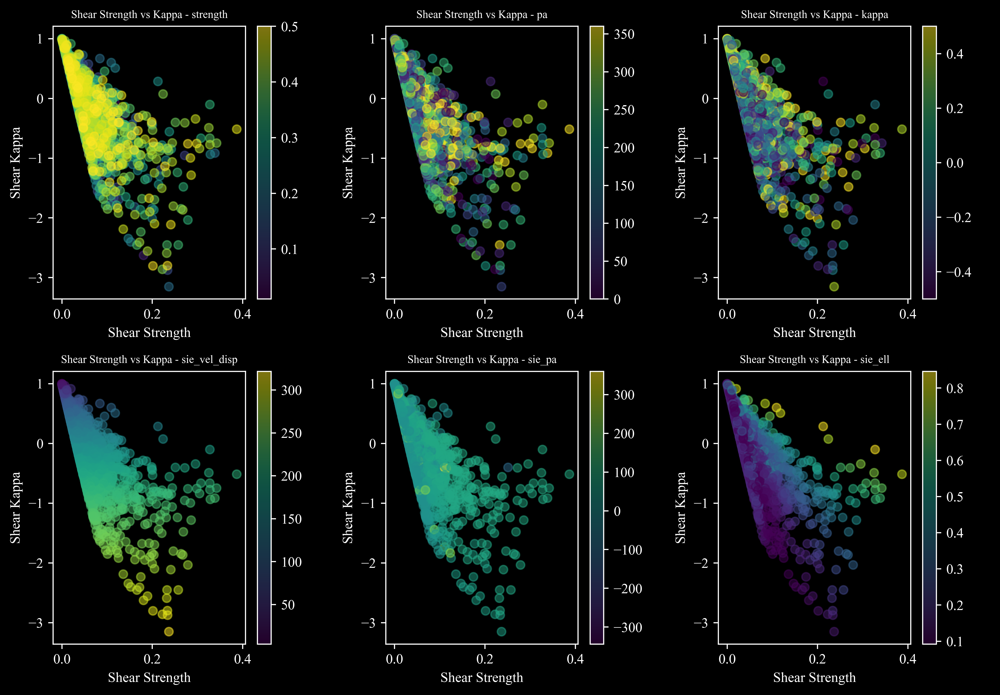

In [25]:
plt.figure(figsize=(10, 10))    

columns = ['strength', 'pa', 'kappa', 'sie_vel_disp', 'sie_pa', 'sie_ell']

for i in range(min(9, len(columns))):
    column = columns[i]
    plt.subplot(3, 3, i + 1)
    plt.scatter(filtered_df['t_shear_str'], filtered_df['t_shear_kappa'], c=filtered_df[column], alpha=0.5)
    plt.colorbar(label=f'{column}')
    plt.xlabel('Shear Strength', color = 'w')
    plt.ylabel('Shear Kappa', color = 'w')
    plt.title(f'Shear Strength vs Kappa - {column}', color = 'w', fontsize=8)
plt.tight_layout()
plt.show()


ValueError: Contour levels must be increasing

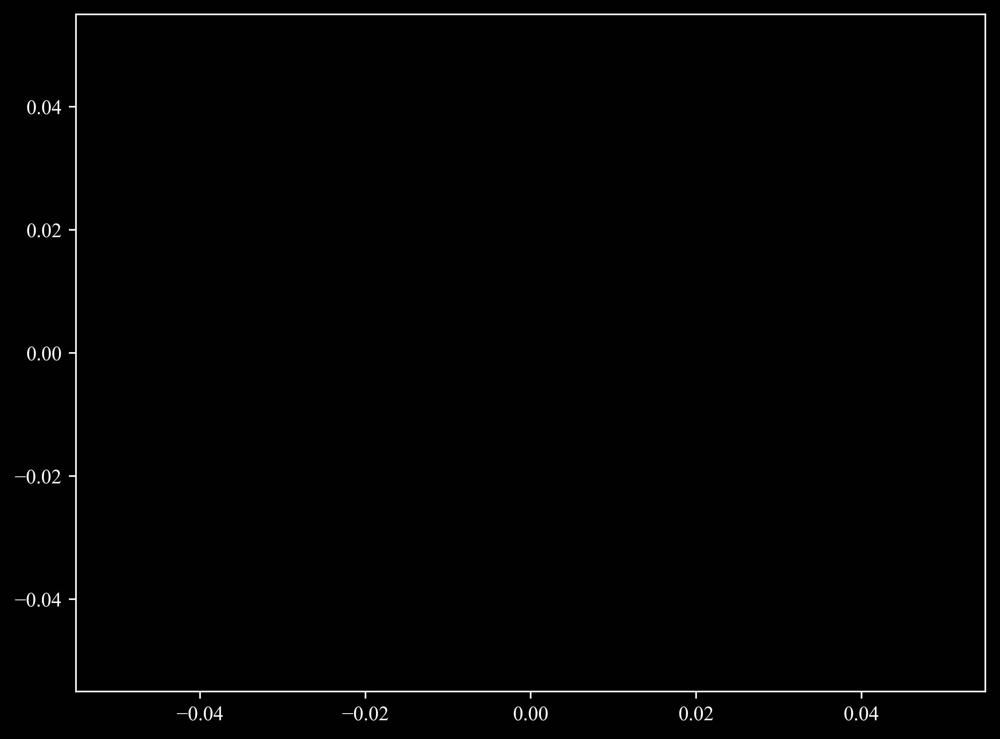

In [27]:
# Contour Plot 
plt.figure(figsize=(8, 6))
sns.kdeplot(y=filtered_df['PERT_$\\kappa$'], x=filtered_df['PERT_$\\gamma$'], 
            cmap='magma', fill=True, thresh=0, levels=300, 
            cbar=True, cbar_kws={'label': 'Density'})

plt.xlabel('Shear Strength', color = 'w')
plt.ylabel('Shear Kappa', color = 'w')
plt.title('Contour Plot of Shear Strength vs Shear Kappa for SIE with Shear')
plt.show()

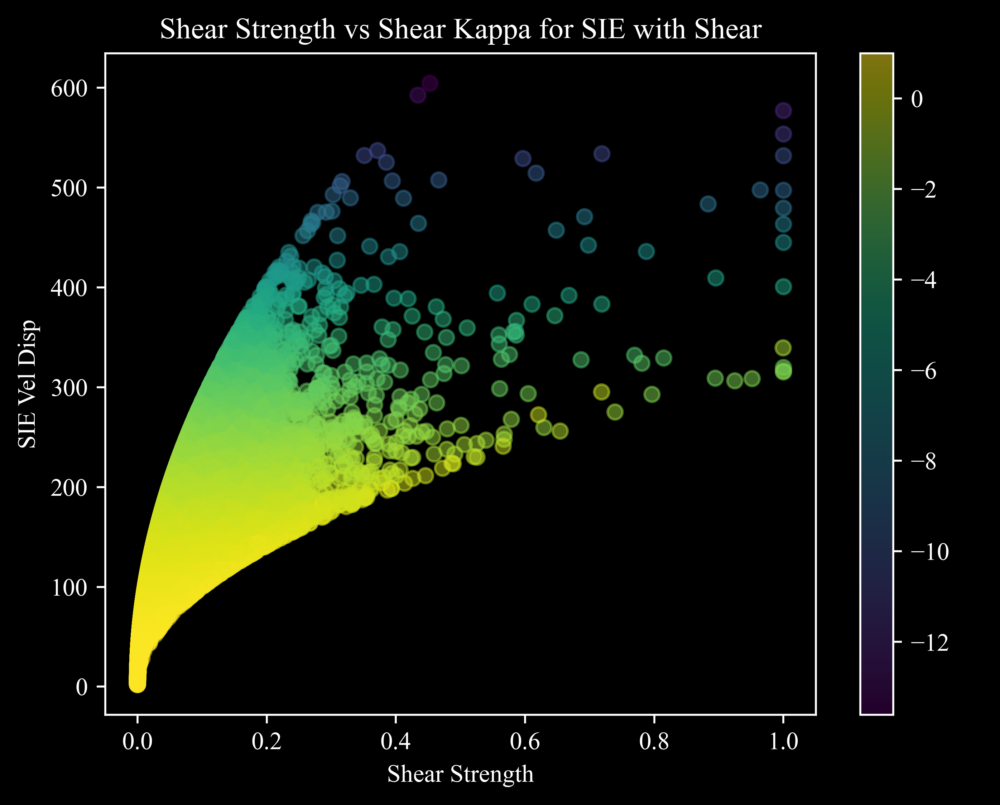

In [28]:
plt.scatter(filtered_df['PERT_$\\gamma$'], filtered_df['SIE_$\\sigma$'], c=filtered_df['PERT_$\\kappa$'], alpha=0.5)
plt.colorbar(label='Shear Kappa')
plt.xlabel('Shear Strength', color = 'w')
plt.ylabel('SIE Vel Disp', color = 'w')
plt.title('Shear Strength vs Shear Kappa for SIE with Shear')
plt.show()

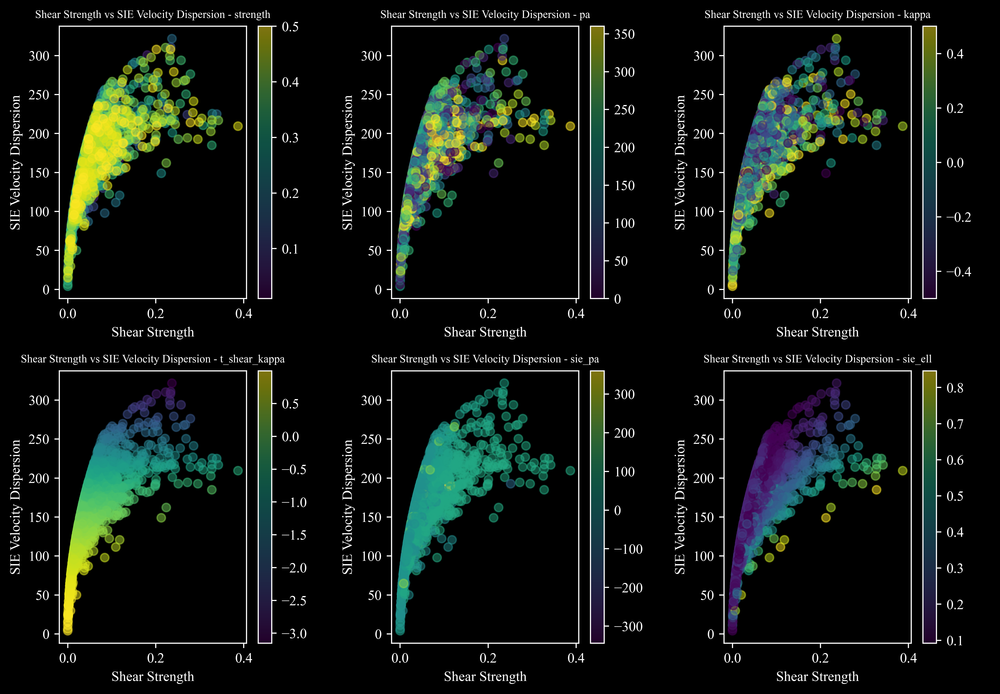

In [28]:
plt.figure(figsize=(10, 10))    

columns = ['strength', 'pa', 'kappa', 't_shear_kappa', 'sie_pa', 'sie_ell']

for i in range(min(9, len(columns))):
    column = columns[i]
    plt.subplot(3, 3, i + 1)
    plt.scatter(filtered_df['t_shear_str'], filtered_df['sie_vel_disp'], c=filtered_df[column], alpha=0.5)
    plt.colorbar(label=f'{column}')
    plt.xlabel('Shear Strength', color = 'w')
    plt.ylabel('SIE Velocity Dispersion', color = 'w')
    plt.title(f'Shear Strength vs SIE Velocity Dispersion - {column}', color = 'w', fontsize=8)
plt.tight_layout()
plt.show()


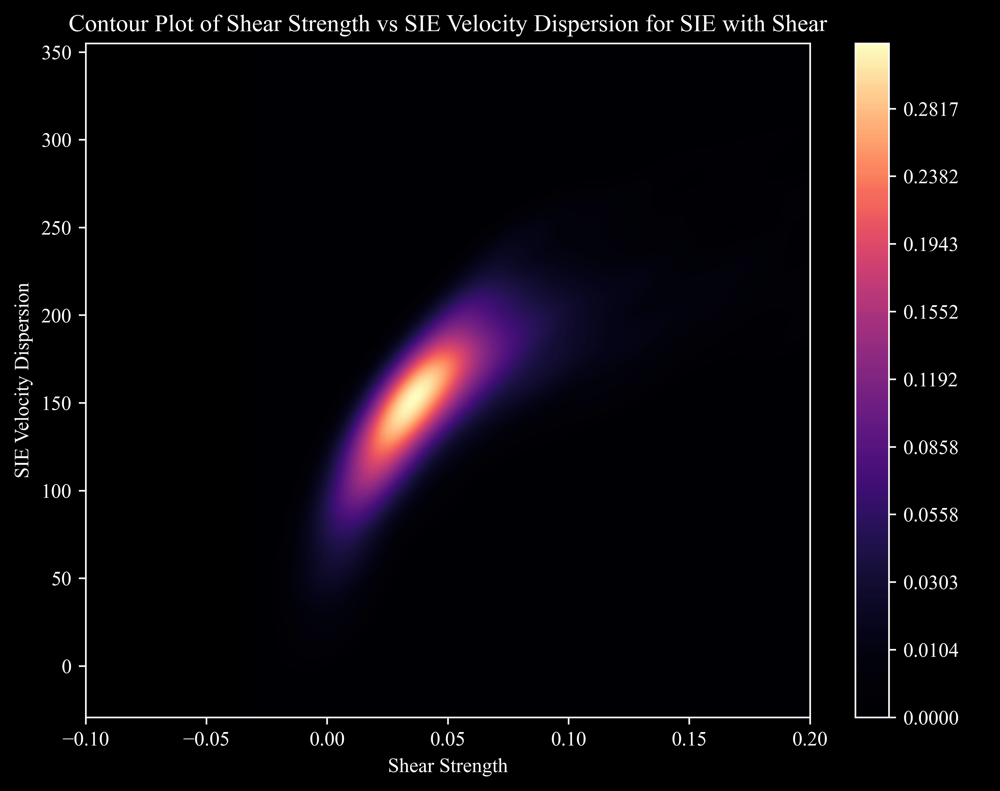

In [29]:
# Contour Plot 
plt.figure(figsize=(8, 6))
sns.kdeplot(y=filtered_df['sie_vel_disp'], x=filtered_df['t_shear_str'], 
            cmap='magma', fill=True, thresh=0, levels=300, 
            cbar=True, cbar_kws={'label': 'Density'})
plt.xlim(-0.1, 0.2)

plt.xlabel('Shear Strength', color = 'w')
plt.ylabel('SIE Velocity Dispersion', color = 'w')
plt.title('Contour Plot of Shear Strength vs SIE Velocity Dispersion for SIE with Shear')
plt.show()

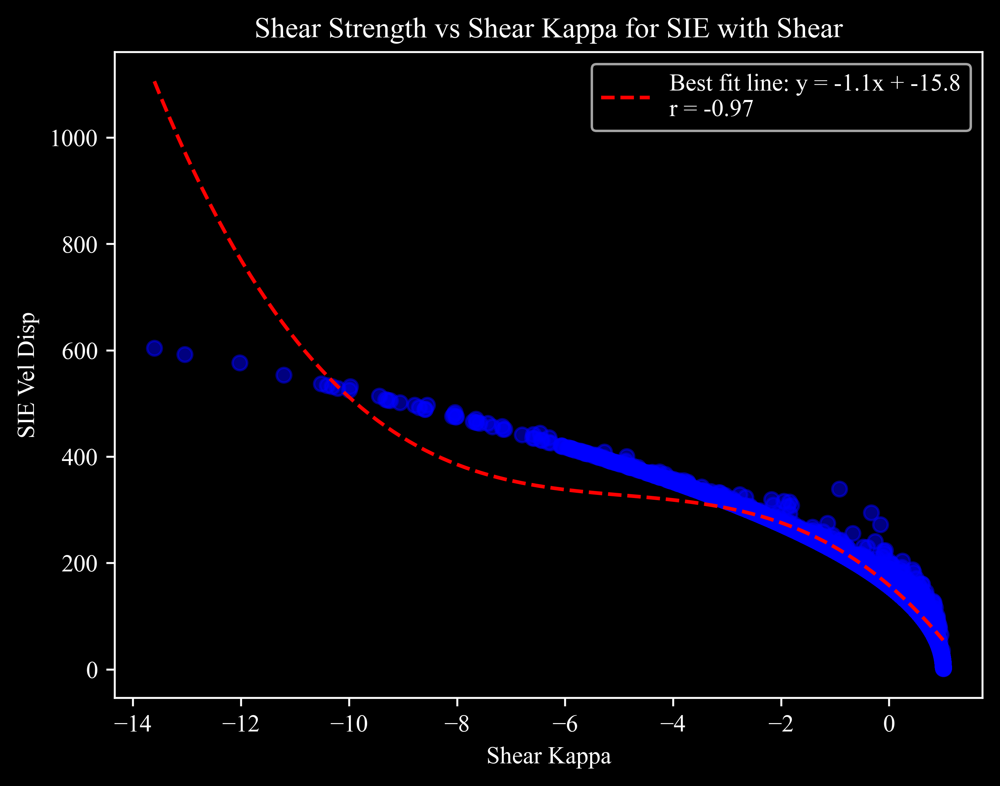

In [30]:
plt.scatter(filtered_df['PERT_$\\kappa$'], filtered_df['SIE_$\\sigma$'], c='blue', alpha=0.5)

# Calculate best fit line
z = np.polyfit(filtered_df['PERT_$\\kappa$'], filtered_df['SIE_$\\sigma$'], 3)
p = np.poly1d(z)

# Calculate correlation coefficient
r = np.corrcoef(filtered_df['PERT_$\\kappa$'], filtered_df['SIE_$\\sigma$'])[0,1]
x_range = np.linspace(filtered_df['PERT_$\\kappa$'].min(), filtered_df['PERT_$\\kappa$'].max(), 100)
plt.plot(x_range, p(x_range), 'r--', 
         label=f'Best fit line: y = {z[0]:.1f}x + {z[1]:.1f}\nr = {r:.2f}')

plt.xlabel('Shear Kappa', color = 'w')
plt.ylabel('SIE Vel Disp', color = 'w')
plt.title('Shear Strength vs Shear Kappa for SIE with Shear')
plt.legend()
plt.show()

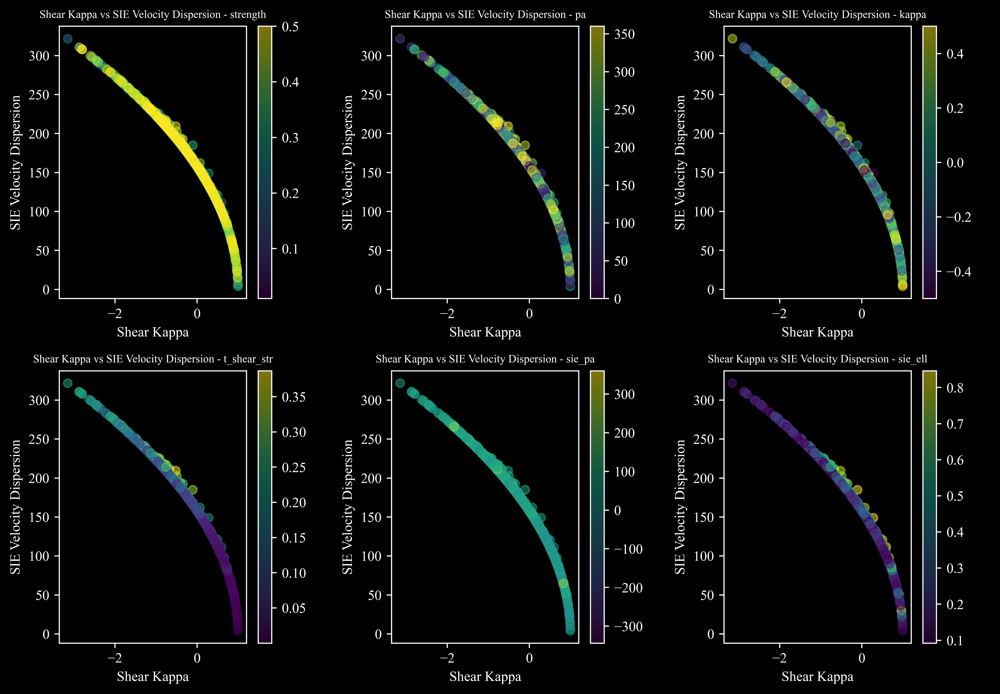

In [31]:
plt.figure(figsize=(10, 10))    

columns = ['strength', 'pa', 'kappa', 't_shear_str', 'sie_pa', 'sie_ell']

for i in range(min(9, len(columns))):
    column = columns[i]
    plt.subplot(3, 3, i + 1)
    plt.scatter(filtered_df['t_shear_kappa'], filtered_df['sie_vel_disp'], c=filtered_df[column], alpha=0.5)
    plt.colorbar(label=f'{column}')
    plt.xlabel('Shear Kappa', color = 'w')
    plt.ylabel('SIE Velocity Dispersion', color = 'w')
    plt.title(f'Shear Kappa vs SIE Velocity Dispersion - {column}', color = 'w', fontsize=8)
plt.tight_layout()
plt.show()


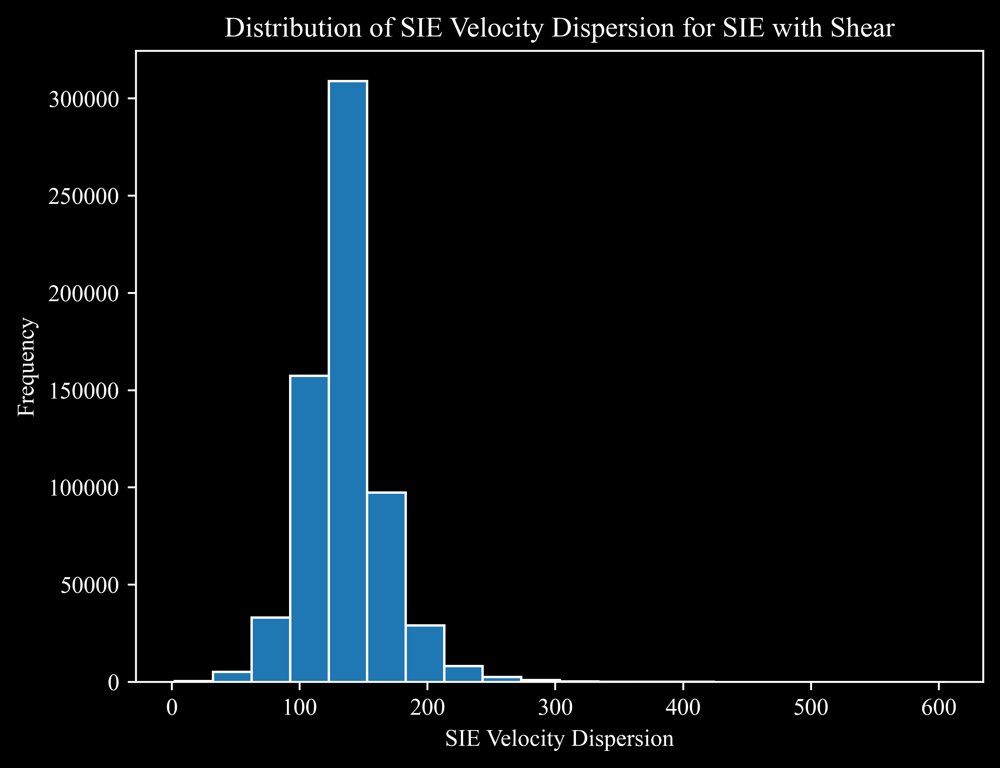

In [31]:
plt.hist(filtered_df['SIE_$\\sigma$'], bins=20, edgecolor='w')
plt.xlabel('SIE Velocity Dispersion', color = 'w')
plt.ylabel('Frequency', color = 'w')
plt.title('Distribution of SIE Velocity Dispersion for SIE with Shear')
plt.show()

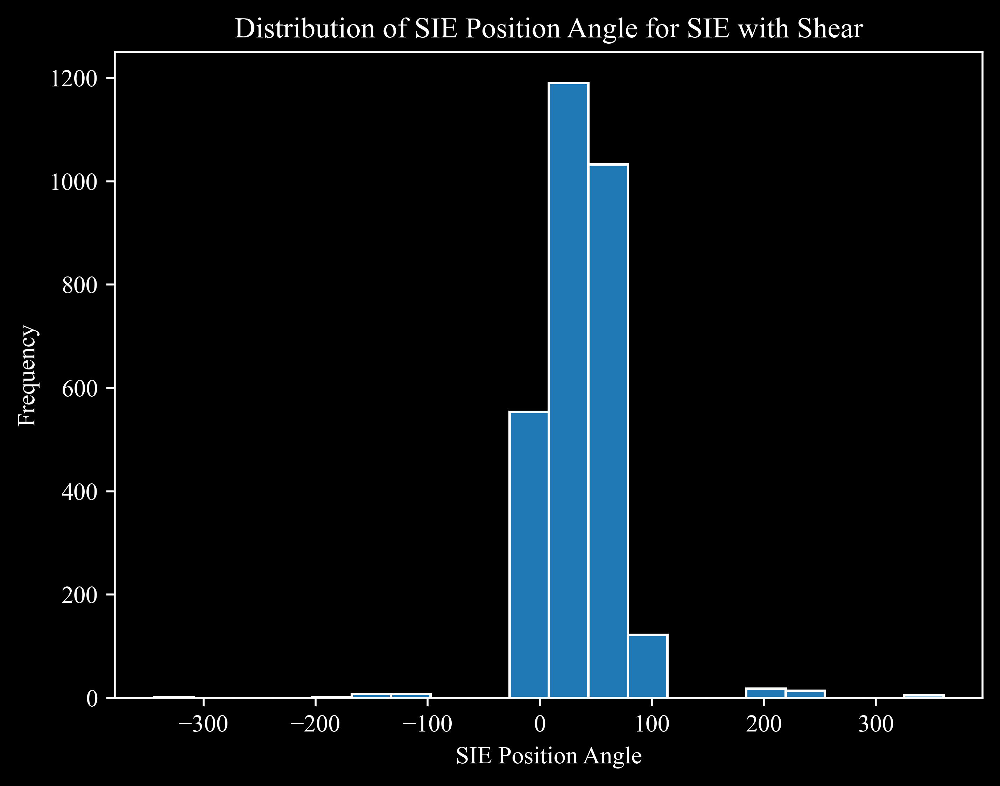

In [33]:
plt.hist(filtered_df['sie_pa'], bins=20, edgecolor='w')
plt.xlabel('SIE Position Angle', color = 'w')
plt.ylabel('Frequency', color = 'w')
plt.title('Distribution of SIE Position Angle for SIE with Shear')
plt.show()

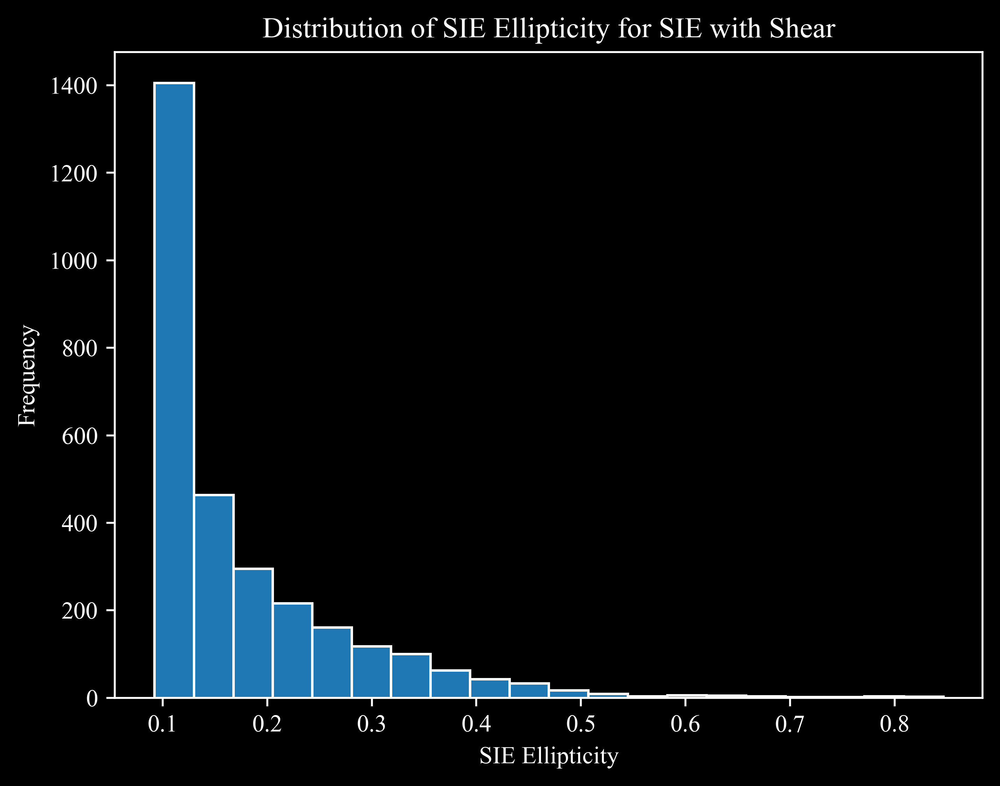

In [34]:
plt.hist(filtered_df['sie_ell'], bins=20, edgecolor='w')
plt.xlabel('SIE Ellipticity', color = 'w')
plt.ylabel('Frequency', color = 'w')
plt.title('Distribution of SIE Ellipticity for SIE with Shear')
plt.show()

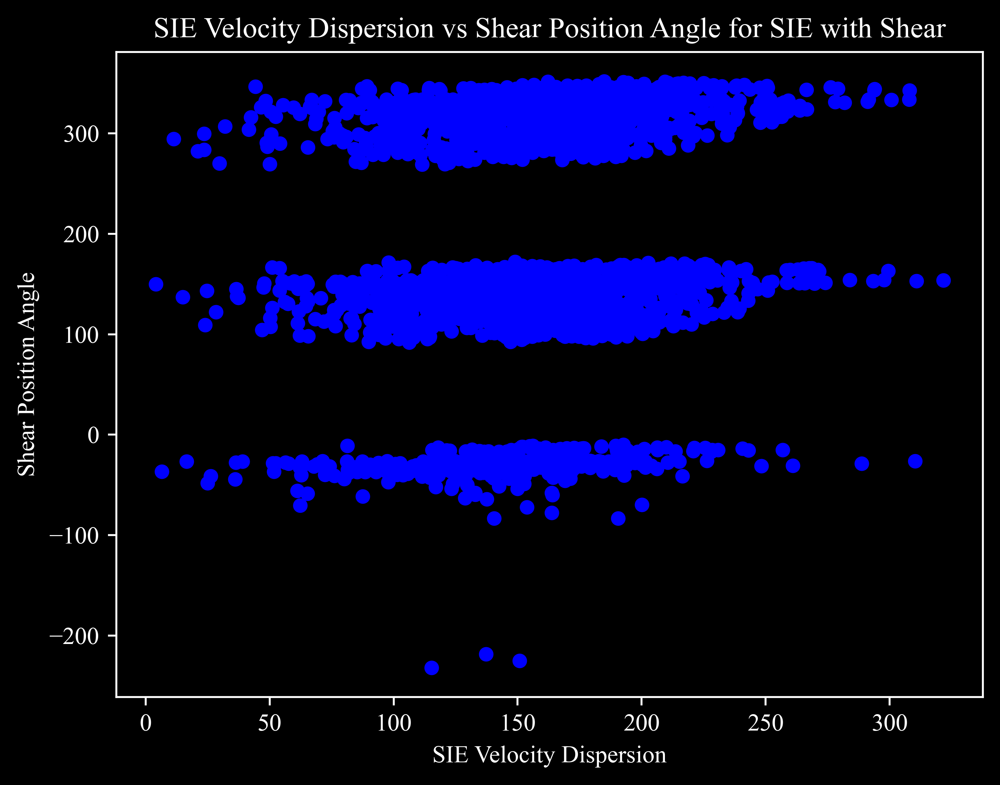

In [35]:
plt.plot(filtered_df['sie_vel_disp'], filtered_df['t_shear_pa'], 'bo', markersize=5, alpha=1)
plt.xlabel('SIE Velocity Dispersion', color = 'w')
plt.ylabel('Shear Position Angle', color = 'w')
plt.title('SIE Velocity Dispersion vs Shear Position Angle for SIE with Shear')
plt.show() 

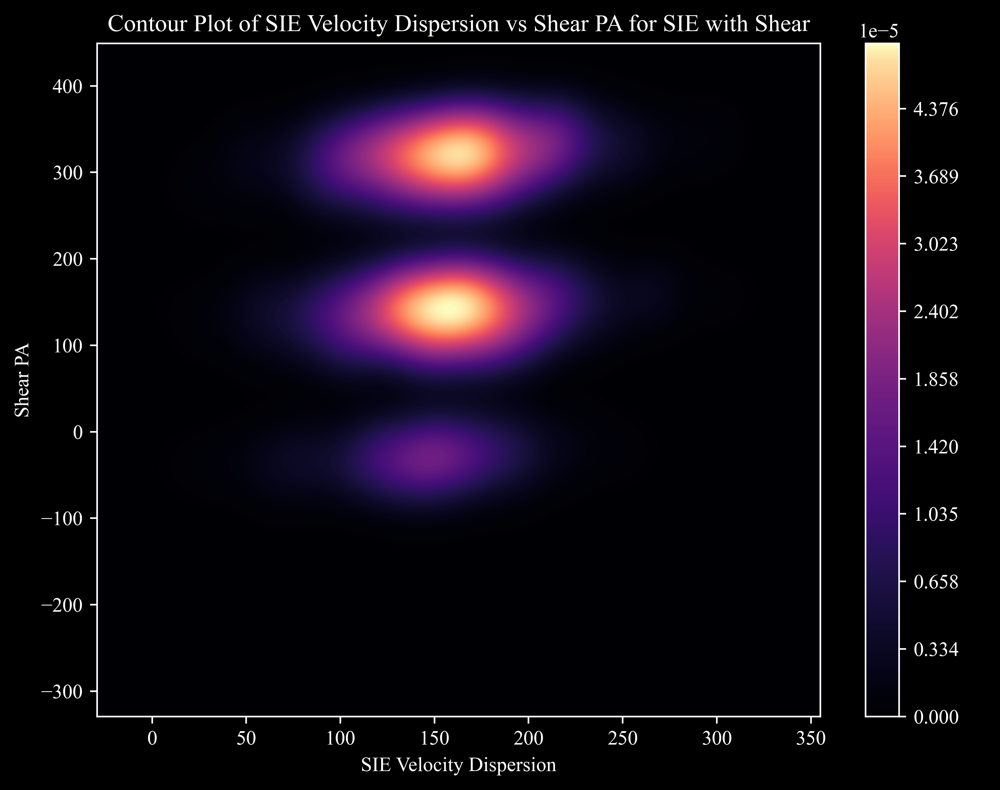

In [36]:
# Contour Plot 
plt.figure(figsize=(8, 6))
sns.kdeplot(x=filtered_df['sie_vel_disp'], y=filtered_df['t_shear_pa'], 
            cmap='magma', fill=True, thresh=0, levels=300, 
            cbar=True, cbar_kws={'label': 'Density'},)

plt.xlabel('SIE Velocity Dispersion', color = 'w')
plt.ylabel('Shear PA', color = 'w')
plt.title('Contour Plot of SIE Velocity Dispersion vs Shear PA for SIE with Shear')
plt.show()

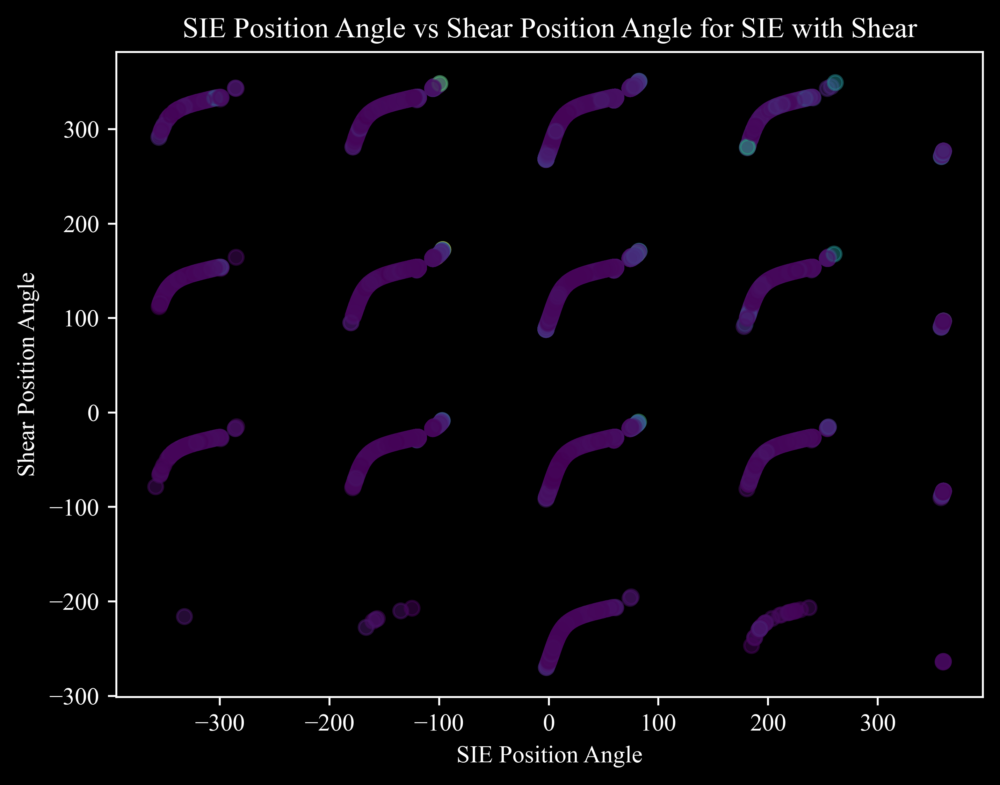

In [34]:
plt.scatter(filtered_df['SIE_$θ_{e}$'], filtered_df['PERT_$θ_{\\gamma}$'], c=filtered_df['PERT_$\\gamma$'], alpha=0.5)
plt.xlabel('SIE Position Angle', color = 'w')
plt.ylabel('Shear Position Angle', color = 'w')
plt.title('SIE Position Angle vs Shear Position Angle for SIE with Shear')
plt.show()